# **Cell 1 – Structired Directory Scraping Function**

In [2]:
import os
import json
from pathlib import Path
from collections import defaultdict
import pandas as pd
from IPython.display import display

# ============================================================
#  CONFIG  – just change this one line
# ============================================================
ROOT = Path("/kaggle/input")          # or a more specific folder if you want
# ============================================================

IMAGE_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.gif', '.webp'}
META_EXTS  = {'.csv', '.tsv', '.xlsx', '.xls', '.json', '.txt', '.xml'}

structure = {}
meta_files = []

def is_image(p: Path) -> bool:
    return p.suffix.lower() in IMAGE_EXTS

def walk(path: Path, current_dict: dict):
    """Recursively build folder structure. Stop when an image is found."""
    print(f"Checking → {path}")          # ← live progress
    
    try:
        entries = sorted(path.iterdir())
    except PermissionError:
        print(f"  ⚠️  Permission denied: {path}")
        return

    has_image = any(is_image(e) for e in entries if e.is_file())
    
    if has_image:
        # This folder contains images → stop going deeper
        current_dict["__contains_images__"] = True
        current_dict["__subdirs__"] = [e.name for e in entries if e.is_dir()]
        print(f"  → Contains images. Stopping deeper traversal.")
        return

    # No images here → continue
    for entry in entries:
        if entry.is_dir():
            current_dict[entry.name] = {}
            walk(entry, current_dict[entry.name])
        elif entry.suffix.lower() in META_EXTS:
            meta_files.append(str(entry))
            current_dict.setdefault("__meta_files__", []).append(entry.name)
            print(f"  → Found metadata: {entry.name}")

# Start walking
print("Scanning structure (stopping at first image in any folder)...\n")
walk(ROOT, structure)

# Save JSON
json_path = "/kaggle/working/structure_inventory.json"
with open(json_path, "w") as f:
    json.dump(structure, f, indent=2)
print(f"\nJSON saved → {json_path}")

# Pretty print the tree
def print_tree(d, indent=0, max_depth=4):
    if indent > max_depth:
        print("  " * indent + "...")
        return
    for k, v in d.items():
        if k.startswith("__"):
            continue
        print("  " * indent + f"📁 {k}/")
        if isinstance(v, dict):
            print_tree(v, indent + 1, max_depth)

print("\n===== FOLDER STRUCTURE (stopped before images) =====")
print_tree(structure)

# Table of all metadata files found
print("\n===== METADATA / CSV FILES FOUND =====")
if meta_files:
    df_meta = pd.DataFrame({
        "Metadata File": meta_files,
        "Parent Folder": [str(Path(p).parent) for p in meta_files]
    })
    display(df_meta)
else:
    print("No CSV / metadata files found.")

print("\nDone. Structure inventory ready.")

Scanning structure (stopping at first image in any folder)...

Checking → /kaggle/input
Checking → /kaggle/input/datasets
Checking → /kaggle/input/datasets/aealemran
Checking → /kaggle/input/datasets/aealemran/eye-diseases
Checking → /kaggle/input/datasets/aealemran/eye-diseases/Eye diseases
Checking → /kaggle/input/datasets/aealemran/eye-diseases/Eye diseases/Color Fundus
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/aealemran/eye-diseases/Eye diseases/Diabetic Retinopathy
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/aealemran/eye-diseases/Eye diseases/Disc Edema
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/aealemran/eye-diseases/Eye diseases/Glaucoma
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/aealemran/eye-diseases/Eye diseases/Healthy
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/aealemran/eye-disease

,Metadata File,Parent Folder
0,/kaggle/input/datasets/andrewmvd/ocular-diseas...,/kaggle/input/datasets/andrewmvd/ocular-diseas...
1,/kaggle/input/datasets/andrewmvd/ocular-diseas...,/kaggle/input/datasets/andrewmvd/ocular-diseas...
2,/kaggle/input/datasets/rohitrawat25/combined-f...,/kaggle/input/datasets/rohitrawat25/combined-f...



Done. Structure inventory ready.


# **Cell 2 – Master Function For Analysis**

In [3]:
import os
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import warnings
warnings.filterwarnings("ignore")

# ============================================================
# MASTER ANALYSIS FUNCTION
# ============================================================
def analyze_dataset(dataset_name: str, root_path: str, class_folders: list = None, 
                    csv_path: str = None, label_col: str = None, image_col: str = None,
                    max_samples_per_class: int = 3):
    """
    Universal analyzer for fundus datasets in the 8-class group.
    
    Parameters:
    -----------
    dataset_name      : Nice display name
    root_path         : Path that contains the class folders OR the images folder
    class_folders     : List of class folder names (if folder-based). Leave None if CSV-based.
    csv_path          : Path to CSV (if label is in CSV)
    label_col         : Column name for class/label in CSV
    image_col         : Column name for image filename in CSV
    max_samples_per_class : How many sample images to show per class
    """
    
    print("="*80)
    print(f"DATASET: {dataset_name}")
    print("="*80)
    
    root = Path(root_path)
    image_exts = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}
    
    # --------------------------------------------------------
    # 1. Collect images + labels
    # --------------------------------------------------------
    data = []          # list of (class_name, full_path)
    
    if csv_path is not None:
        # CSV-based dataset
        df = pd.read_csv(csv_path)
        print(f"CSV loaded: {csv_path}  |  shape = {df.shape}")
        print("Columns:", df.columns.tolist())
        
        if label_col is None or image_col is None:
            print("⚠️  Please provide label_col and image_col")
            return
        
        for _, row in df.iterrows():
            img_name = str(row[image_col])
            label = str(row[label_col])
            # try to find the image
            possible = list(root.rglob(img_name))
            if possible:
                data.append((label, possible[0]))
            else:
                # sometimes only filename without extension or different location
                possible = list(root.rglob(f"*{Path(img_name).stem}*"))
                if possible:
                    data.append((label, possible[0]))
    else:
        # Folder-based dataset
        if class_folders is None:
            # auto-detect class folders (immediate subdirs that contain images)
            class_folders = []
            for p in root.iterdir():
                if p.is_dir():
                    has_img = any(f.suffix.lower() in image_exts for f in p.rglob("*") if f.is_file())
                    if has_img:
                        class_folders.append(p.name)
        
        print(f"Class folders found: {class_folders}")
        
        for cls in class_folders:
            cls_path = root / cls
            if not cls_path.exists():
                # try recursive search
                matches = list(root.rglob(cls))
                if matches:
                    cls_path = matches[0]
                else:
                    print(f"⚠️  Class folder not found: {cls}")
                    continue
            
            for img_path in cls_path.rglob("*"):
                if img_path.suffix.lower() in image_exts:
                    data.append((cls, img_path))
    
    if len(data) == 0:
        print("❌ No images found. Check the path.")
        return
    
    # --------------------------------------------------------
    # 2. Build summary table
    # --------------------------------------------------------
    class_counts = Counter([d[0] for d in data])
    total_images = sum(class_counts.values())
    
    # Resolution & size statistics
    res_per_class = defaultdict(set)
    size_per_class = defaultdict(list)
    
    print("\nCollecting resolution & size info (this may take a moment)...")
    for cls, path in data:
        try:
            img = cv2.imread(str(path))
            if img is None:
                continue
            h, w = img.shape[:2]
            res_per_class[cls].add(f"{w}x{h}")
            size_mb = path.stat().st_size / (1024 * 1024)
            size_per_class[cls].append(size_mb)
        except Exception as e:
            pass
    
    rows = []
    for cls in sorted(class_counts.keys()):
        count = class_counts[cls]
        pct = count / total_images * 100
        resolutions = ", ".join(sorted(res_per_class[cls])) if res_per_class[cls] else "N/A"
        avg_size = np.mean(size_per_class[cls]) if size_per_class[cls] else 0
        rows.append({
            "Class": cls,
            "Image Count": count,
            "Percentage": f"{pct:.1f}%",
            "Resolution(s)": resolutions,
            "Avg Size (MB)": f"{avg_size:.3f}"
        })
    
    # Total row
    all_sizes = [s for sizes in size_per_class.values() for s in sizes]
    rows.append({
        "Class": "TOTAL",
        "Image Count": total_images,
        "Percentage": "100%",
        "Resolution(s)": "-",
        "Avg Size (MB)": f"{np.mean(all_sizes):.3f}" if all_sizes else "0"
    })
    
    df_summary = pd.DataFrame(rows)
    print("\n----- SUMMARY TABLE -----")
    display(df_summary)
    
    # --------------------------------------------------------
    # 3. Per-class sample images
    # --------------------------------------------------------
    print("\n----- SAMPLE IMAGES PER CLASS -----")
    
    classes = sorted(class_counts.keys())
    n_classes = len(classes)
    
    # Limit samples
    samples = defaultdict(list)
    for cls, path in data:
        if len(samples[cls]) < max_samples_per_class:
            samples[cls].append(path)
    
    # Plot
    cols = min(max_samples_per_class, 3)
    rows_plot = n_classes
    
    fig, axes = plt.subplots(rows_plot, cols, figsize=(4*cols, 3.5*rows_plot))
    if rows_plot == 1:
        axes = np.array([axes])
    if cols == 1:
        axes = axes.reshape(-1, 1)
    
    for i, cls in enumerate(classes):
        for j in range(cols):
            ax = axes[i, j]
            if j < len(samples[cls]):
                img = cv2.imread(str(samples[cls][j]))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax.imshow(img)
                ax.set_title(f"{cls}", fontsize=10)
            ax.axis("off")
    
    plt.suptitle(f"{dataset_name} – Sample Images", fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()
    
    # --------------------------------------------------------
    # 4. Statistical analysis
    # --------------------------------------------------------
    print("\n----- IMAGE STATISTICAL ANALYSIS -----")
    
    all_widths, all_heights, all_sizes_mb = [], [], []
    channels = []
    
    for cls, path in data[:min(500, len(data))]:   # sample up to 500 for speed
        try:
            img = cv2.imread(str(path))
            if img is None:
                continue
            h, w = img.shape[:2]
            all_widths.append(w)
            all_heights.append(h)
            all_sizes_mb.append(path.stat().st_size / (1024*1024))
            channels.append(img.shape[2] if len(img.shape) == 3 else 1)
        except:
            pass
    
    stats = {
        "Total Images Analyzed": len(all_widths),
        "Unique Resolutions": len(set(zip(all_widths, all_heights))),
        "Width  – min / mean / max": f"{min(all_widths)} / {np.mean(all_widths):.0f} / {max(all_widths)}",
        "Height – min / mean / max": f"{min(all_heights)} / {np.mean(all_heights):.0f} / {max(all_heights)}",
        "File Size (MB) – min / mean / max": f"{min(all_sizes_mb):.3f} / {np.mean(all_sizes_mb):.3f} / {max(all_sizes_mb):.3f}",
        "Channels (most common)": Counter(channels).most_common(1)[0][0] if channels else "N/A"
    }
    
    for k, v in stats.items():
        print(f"{k:35s} : {v}")
    
    print("\n" + "="*80 + "\n")

# **Part 3 – Individual Calls**

DATASET: ODIR-5K
CSV loaded: /kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/full_df.csv  |  shape = (6392, 19)
Columns: ['ID', 'Patient Age', 'Patient Sex', 'Left-Fundus', 'Right-Fundus', 'Left-Diagnostic Keywords', 'Right-Diagnostic Keywords', 'N', 'D', 'G', 'C', 'A', 'H', 'M', 'O', 'filepath', 'labels', 'target', 'filename']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,['A'],266,4.2%,512x512,0.061
1,['C'],293,4.6%,512x512,0.047
2,['D'],1608,25.2%,512x512,0.062
3,['G'],284,4.4%,512x512,0.054
4,['H'],128,2.0%,512x512,0.063
5,['M'],232,3.6%,512x512,0.062
6,['N'],2873,44.9%,512x512,0.059
7,['O'],708,11.1%,512x512,0.059
8,TOTAL,6392,100%,-,0.059



----- SAMPLE IMAGES PER CLASS -----


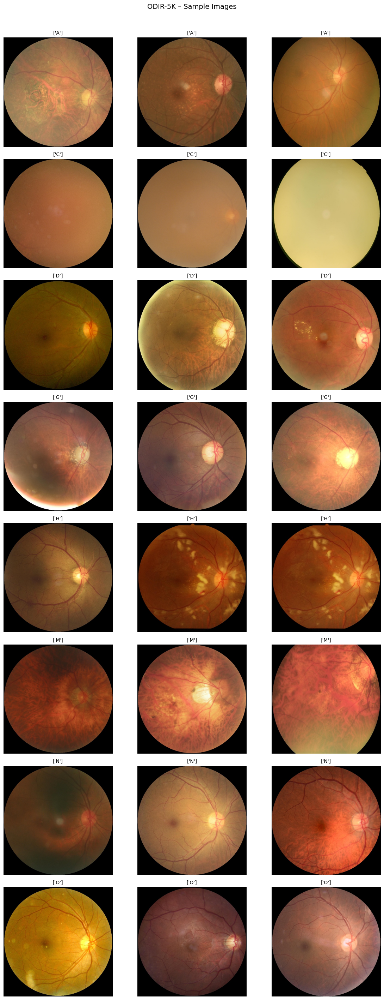


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 1
Width  – min / mean / max           : 512 / 512 / 512
Height – min / mean / max           : 512 / 512 / 512
File Size (MB) – min / mean / max   : 0.029 / 0.060 / 0.096
Channels (most common)              : 3




In [6]:
# 1. ODIR-5K (andrewmvd) - CORRECTED
analyze_dataset(
    dataset_name = "ODIR-5K",
    root_path    = "/kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k",
    csv_path     = "/kaggle/input/datasets/andrewmvd/ocular-disease-recognition-odir5k/full_df.csv",
    label_col    = "labels",      # we will confirm after loading
    image_col    = "filename"     # we will confirm after loading
)

DATASET: Combined Fundus Images
CSV loaded: /kaggle/input/datasets/rohitrawat25/combined-fundus-images/Dataset/label_images.csv  |  shape = (9868, 19)
Columns: ['ID', 'Patient Age', 'Patient Sex', 'Left-Fundus', 'Right-Fundus', 'Left-Diagnostic Keywords', 'Right-Diagnostic Keywords', 'N', 'D', 'G', 'C', 'A', 'H', 'M', 'O', 'filepath', 'label', 'target', 'images']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,['A'],708,7.2%,512x512,0.178
1,['C'],897,9.1%,512x512,0.177
2,['D'],1608,16.3%,512x512,0.062
3,['G'],1071,10.9%,512x512,0.187
4,['H'],430,4.4%,512x512,0.217
5,['M'],1036,10.5%,512x512,0.066
6,['N'],3230,32.7%,512x512,0.078
7,['O'],888,9.0%,512x512,0.095
8,TOTAL,9868,100%,-,0.110



----- SAMPLE IMAGES PER CLASS -----


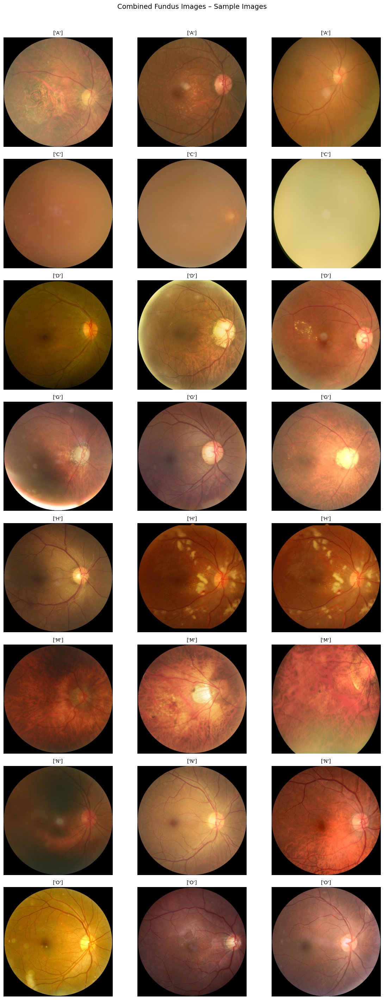


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 1
Width  – min / mean / max           : 512 / 512 / 512
Height – min / mean / max           : 512 / 512 / 512
File Size (MB) – min / mean / max   : 0.029 / 0.060 / 0.096
Channels (most common)              : 3




In [8]:
# 2. Combined Fundus Images - CORRECTED
analyze_dataset(
    dataset_name = "Combined Fundus Images",
    root_path    = "/kaggle/input/datasets/rohitrawat25/combined-fundus-images/Dataset/images",
    csv_path     = "/kaggle/input/datasets/rohitrawat25/combined-fundus-images/Dataset/label_images.csv",
    label_col    = "label",
    image_col    = "images"
)

DATASET: Ocular Disease Dataset (manan1717)
Class folders found: ['A', 'C', 'D', 'G', 'H', 'M', 'N']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,A,511,4.9%,512x512,0.243
1,C,1008,9.6%,512x512,0.051
2,D,3128,29.9%,"1256x1257, 1257x1255, 1257x1256, 1257x1257, 12...",0.410
3,G,1646,15.8%,"1090x1080, 1250x1249, 1266x1255, 1266x1257, 12...",0.409
4,H,420,4.0%,"1266x1255, 1266x1256, 1266x1257, 1266x1265, 14...",0.321
5,M,739,7.1%,"1001x893, 1026x894, 1058x893, 1257x1255, 1257x...",0.397
6,N,2997,28.7%,"1017x894, 1023x1015, 1057x960, 1089x960, 1090x...",0.456
7,TOTAL,10449,100%,-,0.376



----- SAMPLE IMAGES PER CLASS -----


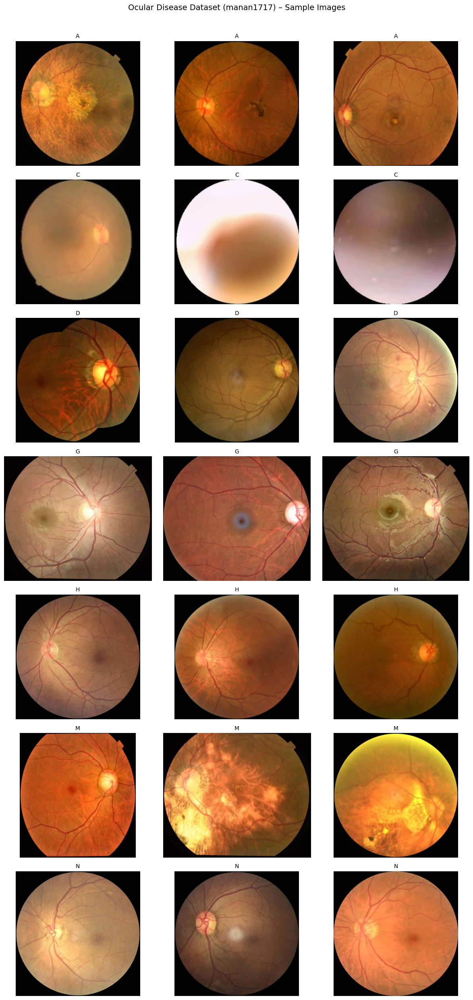


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 1
Width  – min / mean / max           : 512 / 512 / 512
Height – min / mean / max           : 512 / 512 / 512
File Size (MB) – min / mean / max   : 0.125 / 0.243 / 0.355
Channels (most common)              : 3




In [9]:
# 3. Ocular Disease Dataset (manan1717)
analyze_dataset(
    dataset_name = "Ocular Disease Dataset (manan1717)",
    root_path    = "/kaggle/input/datasets/manan1717/ocular-disease-dataset/preprocessed",
    class_folders = ["A", "C", "D", "G", "H", "M", "N"]
)

DATASET: eye-diseases-classification
Class folders found: ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,cataract,1038,24.6%,"1848x1224, 2464x1632, 256x256, 2592x1728, 512x512",0.286
1,diabetic_retinopathy,1098,26.0%,512x512,0.060
2,glaucoma,1007,23.9%,"1848x1224, 2464x1632, 256x256, 2592x1728, 512x512",0.309
3,normal,1074,25.5%,512x512,0.059
4,TOTAL,4217,100%,-,0.175



----- SAMPLE IMAGES PER CLASS -----


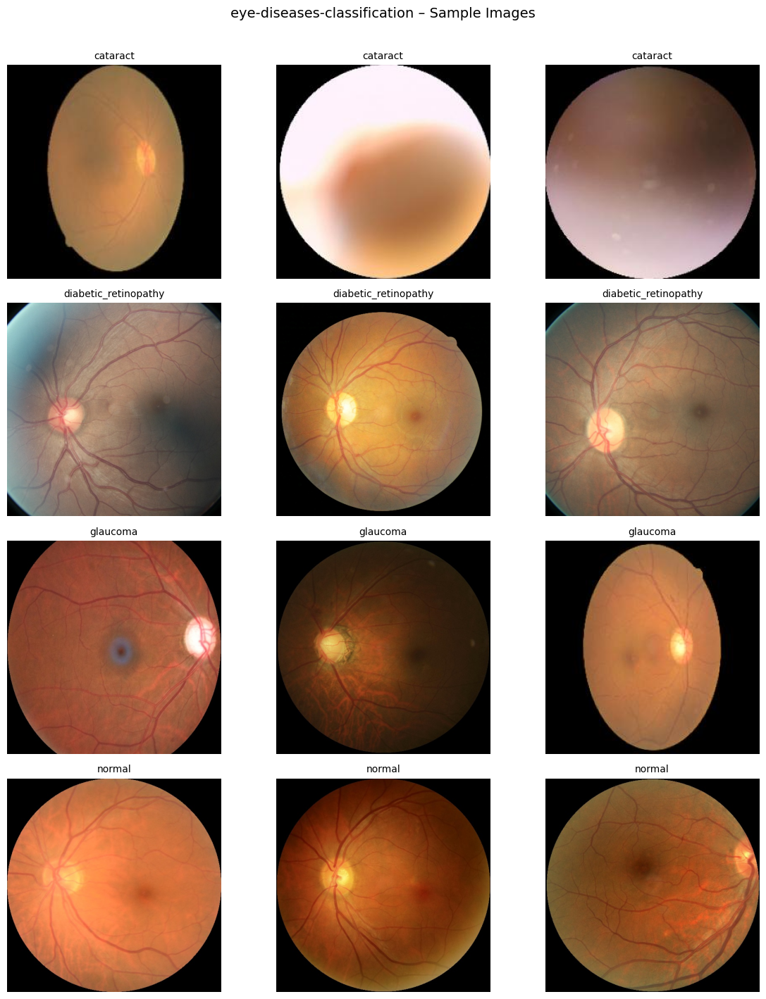


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 5
Width  – min / mean / max           : 256 / 524 / 2592
Height – min / mean / max           : 256 / 451 / 1728
File Size (MB) – min / mean / max   : 0.004 / 0.261 / 3.246
Channels (most common)              : 3




In [10]:
# 4. eye-diseases-classification
analyze_dataset(
    dataset_name = "eye-diseases-classification",
    root_path    = "/kaggle/input/datasets/fahadhasan93/eye-diseases-classification/dataset",
    class_folders = ["cataract", "diabetic_retinopathy", "glaucoma", "normal"]
)

DATASET: Eye Diseases (belalsafy)
Class folders found: ['Age related Macular Degeneration', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Normal', 'Other diseases', 'Pathological Myopia']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,Age related Macular Degeneration,328,4.0%,"1320x1065, 1375x1085, 1380x1382, 1444x1444, 14...",0.190
1,Cataract,424,5.2%,"1380x1382, 1468x1300, 1468x1470, 1468x1472, 14...",0.189
2,Diabetes,2256,27.4%,"1280x960, 1380x1382, 1444x1444, 1468x1470, 146...",0.195
3,Glaucoma,430,5.2%,"1380x1382, 1440x1080, 1444x1444, 1467x1471, 14...",0.205
4,Hypertension,206,2.5%,"1380x1382, 1444x1444, 1536x1152, 1677x1260, 19...",0.184
5,Normal,2280,27.7%,"1280x960, 1380x1382, 1440x1080, 1444x1444, 146...",0.193
6,Other diseases,1958,23.8%,"1380x1382, 1440x1080, 1444x1444, 1468x1470, 14...",0.193
7,Pathological Myopia,348,4.2%,"1280x960, 1380x1382, 1444x1444, 1468x1470, 146...",0.185
8,TOTAL,8230,100%,-,0.193



----- SAMPLE IMAGES PER CLASS -----


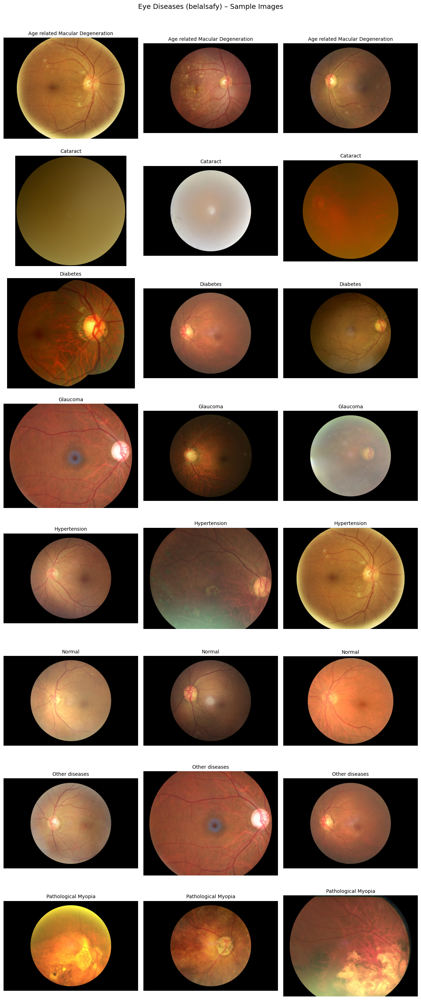


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 43
Width  – min / mean / max           : 1320 / 2519 / 4496
Height – min / mean / max           : 894 / 1844 / 3000
File Size (MB) – min / mean / max   : 0.055 / 0.194 / 0.702
Channels (most common)              : 3




In [11]:
# 5. Eye Diseases (belalsafy)
analyze_dataset(
    dataset_name = "Eye Diseases (belalsafy)",
    root_path    = "/kaggle/input/datasets/belalsafy/eye-diseases/dataset",
    class_folders = [
        "Age related Macular Degeneration", "Cataract", "Diabetes",
        "Glaucoma", "Hypertension", "Normal", "Other diseases", "Pathological Myopia"
    ]
)

DATASET: eye diseases (mohamedgamal295)
Class folders found: ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal', 'retina_disease']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,cataract,1038,24.0%,"1848x1224, 2464x1632, 256x256, 2592x1728, 512x512",0.286
1,diabetic_retinopathy,1098,25.4%,512x512,0.060
2,glaucoma,1007,23.3%,"1848x1224, 2464x1632, 256x256, 2592x1728, 512x512",0.309
3,normal,1074,24.9%,512x512,0.059
4,retina_disease,100,2.3%,"1848x1224, 2464x1632, 2592x1728",2.858
5,TOTAL,4317,100%,-,0.237



----- SAMPLE IMAGES PER CLASS -----


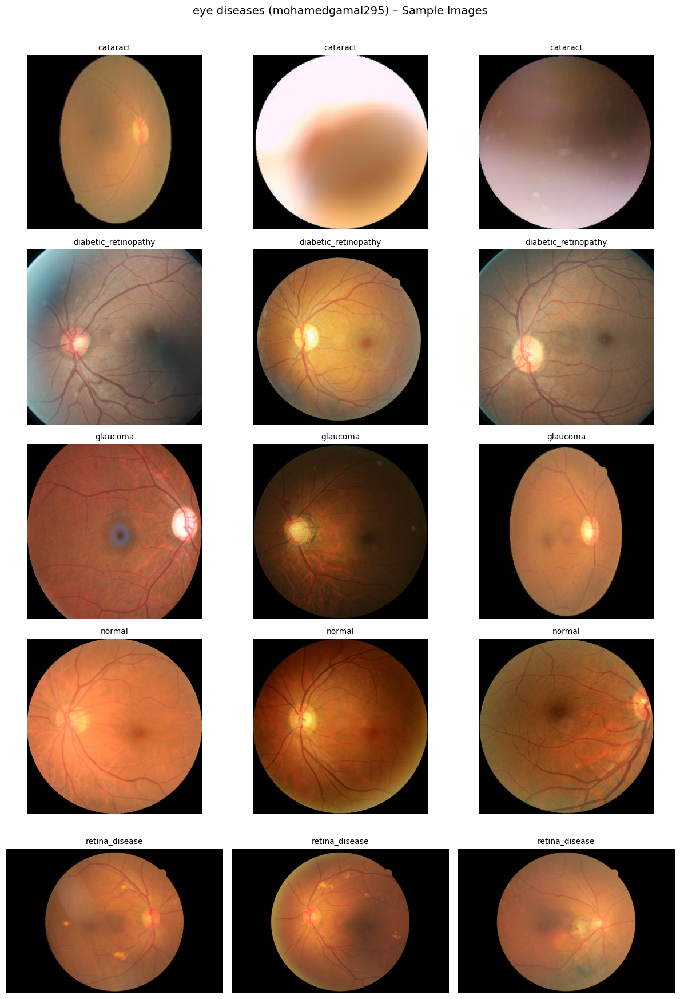


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 5
Width  – min / mean / max           : 256 / 524 / 2592
Height – min / mean / max           : 256 / 451 / 1728
File Size (MB) – min / mean / max   : 0.004 / 0.261 / 3.246
Channels (most common)              : 3




In [12]:
# 6. eye diseases (mohamedgamal295)
analyze_dataset(
    dataset_name = "eye diseases (mohamedgamal295)",
    root_path    = "/kaggle/input/datasets/mohamedgamal295/eye-diseases/dataset",
    class_folders = ["cataract", "diabetic_retinopathy", "glaucoma", "normal", "retina_disease"]
)

DATASET: eye diseases 2
Class folders found: ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,cataract,1038,24.6%,"1848x1224, 2464x1632, 256x256, 2592x1728, 512x512",0.286
1,diabetic_retinopathy,1098,26.0%,512x512,0.060
2,glaucoma,1007,23.9%,"1848x1224, 2464x1632, 256x256, 2592x1728, 512x512",0.309
3,normal,1074,25.5%,512x512,0.059
4,TOTAL,4217,100%,-,0.175



----- SAMPLE IMAGES PER CLASS -----


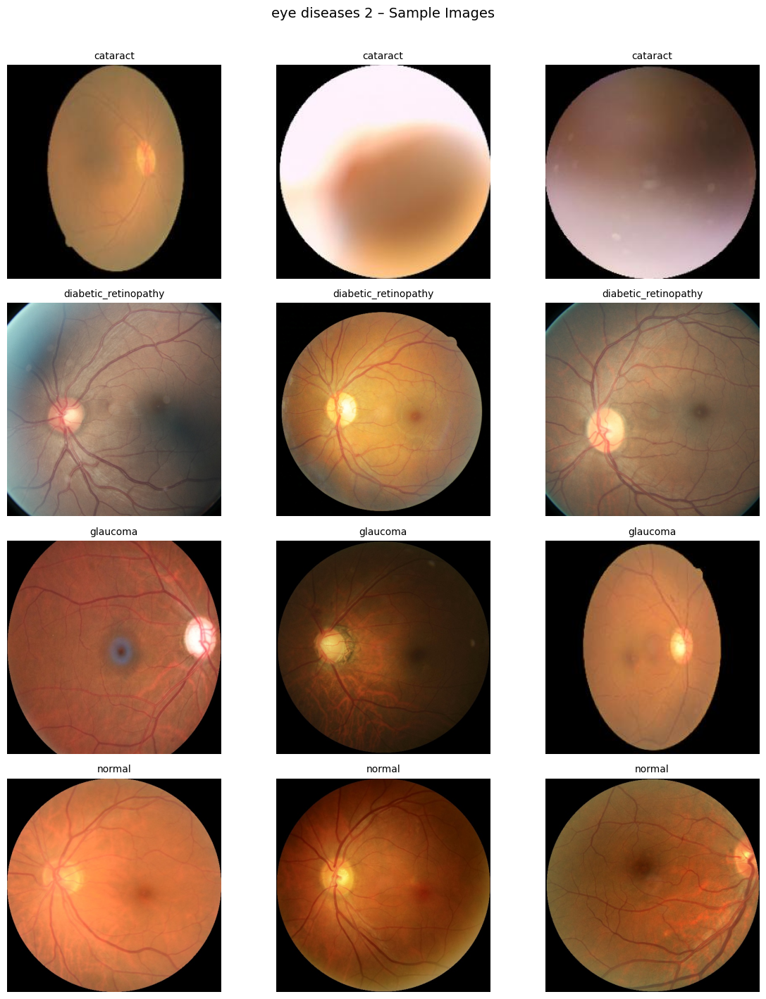


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 5
Width  – min / mean / max           : 256 / 524 / 2592
Height – min / mean / max           : 256 / 451 / 1728
File Size (MB) – min / mean / max   : 0.004 / 0.261 / 3.246
Channels (most common)              : 3




In [13]:
# 7. eye diseases 2
analyze_dataset(
    dataset_name = "eye diseases 2",
    root_path    = "/kaggle/input/datasets/mohamedgamal295/eye-diseases-2/eye diseases",
    class_folders = ["cataract", "diabetic_retinopathy", "glaucoma", "normal"]
)